#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [2]:
# Download YOLOv7 repository and install requirements
%cd ../yolov7
!pip install -r requirements.txt --user

s:\Projects\UTFR\repo\utfr_dv\src\perception\ml-yolo\yolov7


# Download Correctly Formatted Custom Data

Next, we'll download our dataset in the right format. Use the `YOLOv7 PyTorch` export. Note that this model requires YOLO TXT annotations, a custom YAML file, and organized directories. The roboflow export writes this for us and saves it in the correct spot.


In [3]:
!pip install roboflow --user
%cd ../yolov7

from roboflow import Roboflow
rf = Roboflow(api_key="2t7BGrdSeei6PedVDN72")
project = rf.workspace("ourdataset1").project("test-77tmf")
dataset = project.version(4).download("yolov7")

  Using cached urllib3-1.26.6-py2.py3-none-any.whl (138 kB)
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.26.12
    Uninstalling urllib3-1.26.12:
      Successfully uninstalled urllib3-1.26.12
s:\Projects\UTFR\repo\utfr_dv\src\perception\ml-yolo\yolov7


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentry-sdk 1.10.1 requires urllib3>=1.26.11; python_version >= "3.6", but you have urllib3 1.26.6 which is incompatible.


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to test-4 in yolov7pytorch:: 100%|██████████| 4300/4300 [00:02<00:00, 1472.32it/s]


# Begin Custom Training

We're ready to start custom training.

NOTE: We will only modify one of the YOLOv7 training defaults in our example: `epochs`. We will adjust from 300 to 100 epochs in our example for speed. If you'd like to change other settings, see details in [our accompanying blog post](https://blog.roboflow.com/yolov7-custom-dataset-training-tutorial/).

In [ ]:
# download COCO starting checkpoint 
%cd ../yolov7
!python -m wget https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7_training.pt

[WinError 2] The system cannot find the file specified: 'yolov7'
s:\Projects\UTFR\repo\utfr_dv\src\perception\ml-yolo\yolov7

Saved under yolov7_training (1).pt


In [7]:
!nvidia-smi

Sun Nov  6 17:07:56 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 522.25       Driver Version: 522.25       CUDA Version: 11.8     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0  On |                  N/A |
| N/A   56C    P8    10W /  N/A |    494MiB /  8192MiB |     10%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [5]:
import torch
print(torch.cuda.is_available())
print(torch.__version__)

True
1.13.0


In [7]:
# Key = d5ee28c07bb6ff21d616ad02e497ea92fe166f8c
!pip install "wandb==0.13.3"
import wandb
wandb.login()

  Using cached wandb-0.13.3-py2.py3-none-any.whl (1.8 MB)
  Attempting uninstall: wandb
    Found existing installation: wandb 0.12.10
    Uninstalling wandb-0.12.10:
      Successfully uninstalled wandb-0.12.10


True

In [9]:
# run this cell to begin training
# Hyperparameters are in folders data/hyp.scratch.p5.yaml
%cd ../yolov7

!python train.py --adam --batch 8 --epochs 60 --workers 8 --device 0 --weights 'yolov7_training.pt' --data {dataset.location}/data.yaml --img 640 640 --cfg cfg/training/yolov7.yaml --project yolov7-roboflow-wandb 
#!python train.py --batch 2 --epochs 4 --device 0 --weights 'yolov7_training.pt' --data {dataset.location}/data.yaml --cfg cfg/training/yolov7.yaml --project yolov7-roboflow-wandb 

s:\Projects\UTFR\repo\utfr_dv\src\perception\ml-yolo\yolov7


Traceback (most recent call last):
  File "train.py", line 712, in <module>
    main(None)
  File "train.py", line 594, in main
    opt.save_dir = increment_path(Path(opt.project) / opt.name, exist_ok=opt.exist_ok | opt.evolve)  # increment run
TypeError: unsupported operand type(s) for |: 'bool' and 'NoneType'


# Evaluation

We can evaluate the performance of our custom training using the provided evalution script.

Note we can adjust the below custom arguments. For details, see [the arguments accepted by detect.py](https://github.com/WongKinYiu/yolov7/blob/main/detect.py#L154).

In [ ]:
# Run evaluation
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.1 --source {dataset.location}/test/images


Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/yolov7/test-3/test/images', update=False, view_img=False, weights=['runs/train/exp/weights/best.pt'])
YOLOR 🚀 v0.1-114-g8b616af torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36497954 parameters, 6194944 gradients, 103.2 GFLOPS
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is

In [ ]:
# Run evaluation on skidpad
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.1 --source /content/drive/MyDrive/UTFR_DV/Tutorial_2/autox2_vid

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/MyDrive/UTFR_DV/Tutorial_2/autox2_vid', update=False, view_img=False, weights=['runs/train/exp/weights/best.pt'])
YOLOR 🚀 v0.1-114-g8b616af torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 314 layers, 36497954 parameters, 6194944 gradients, 103.2 GFLOPS
 Convert model to Traced-model... 
 traced_script_module

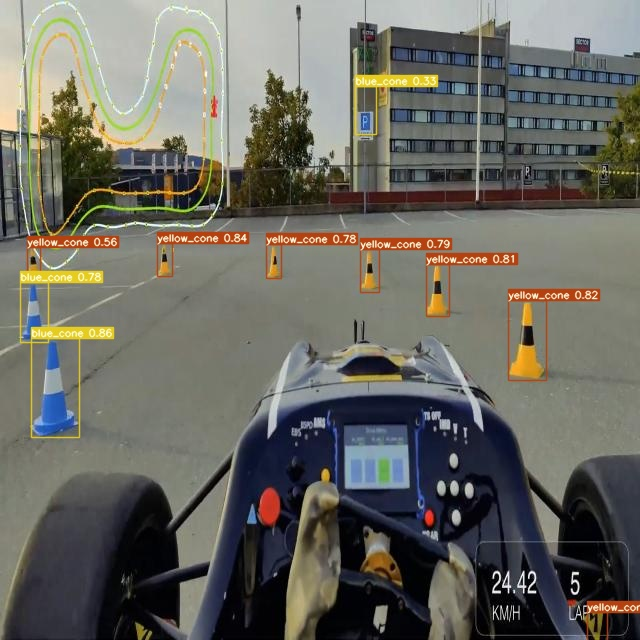

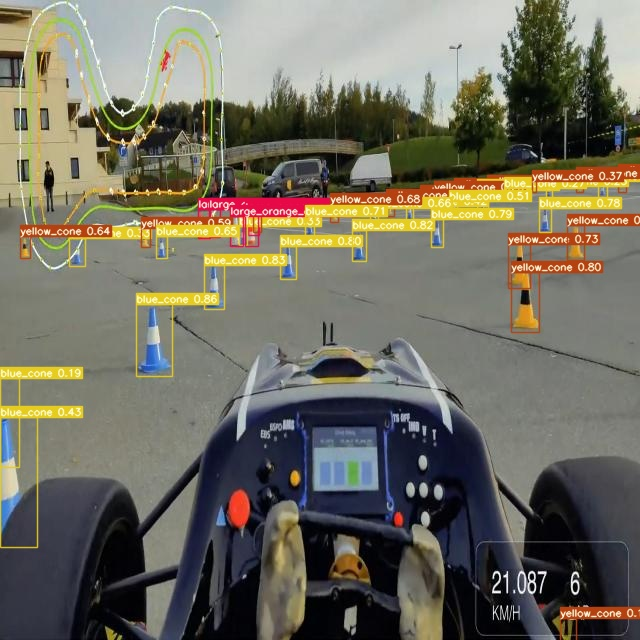

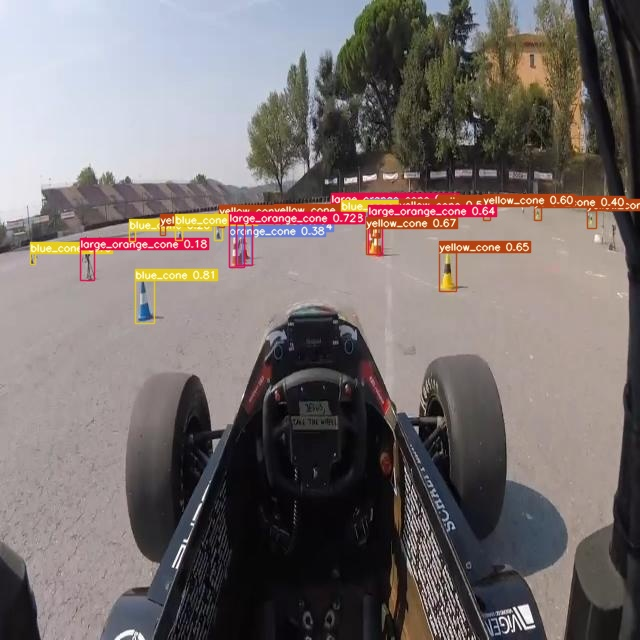

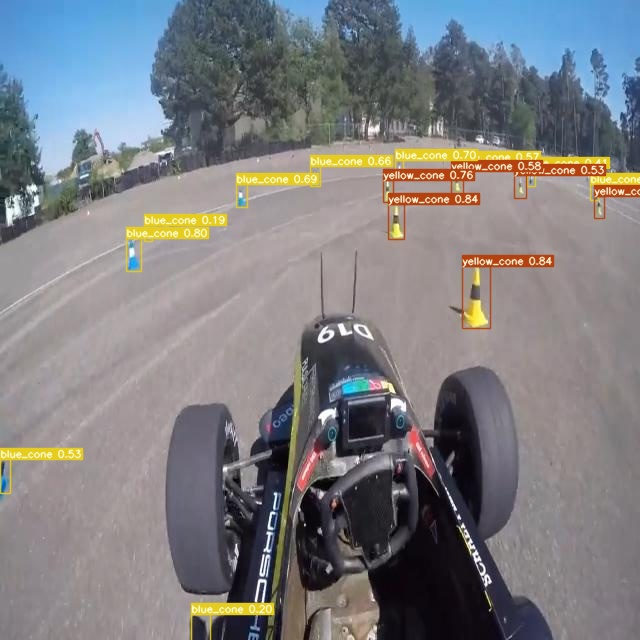

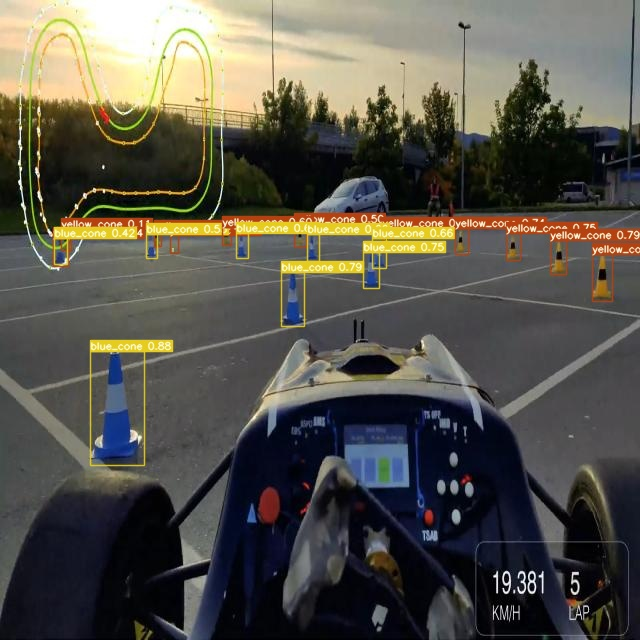

...

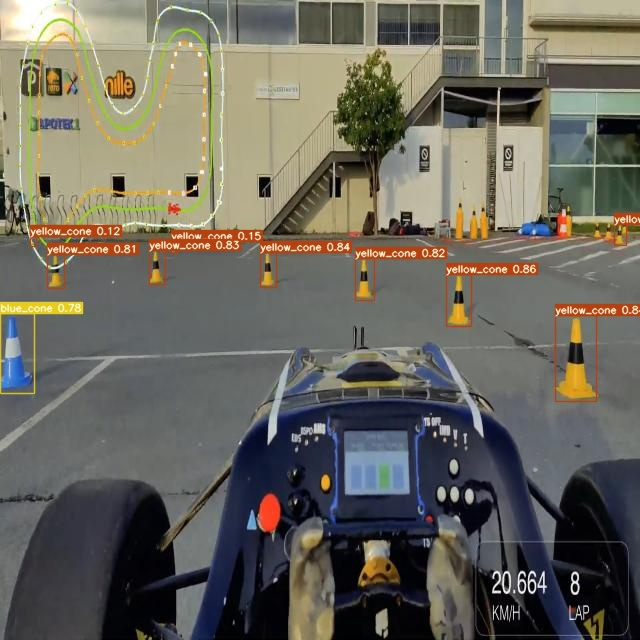

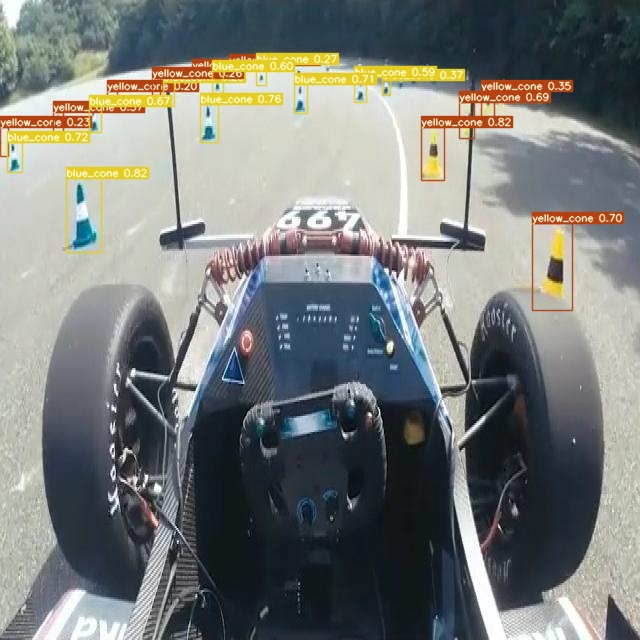

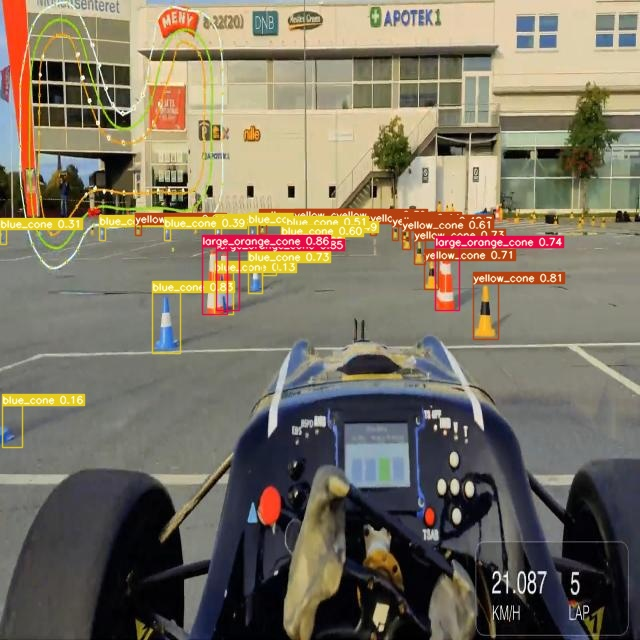

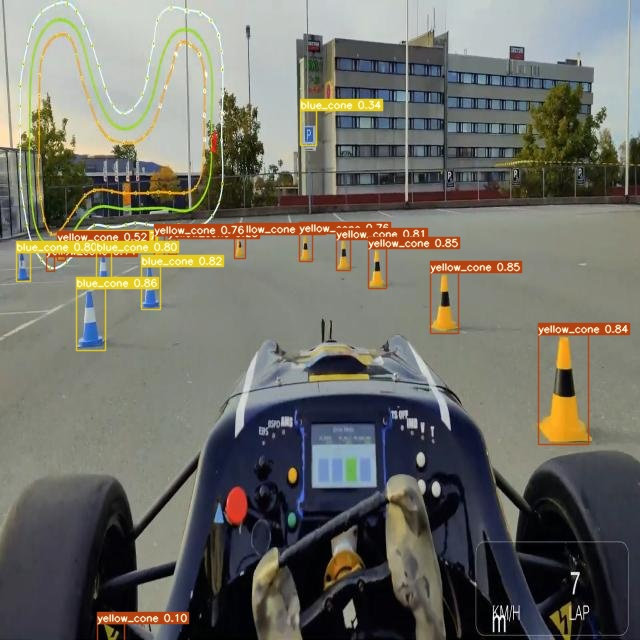

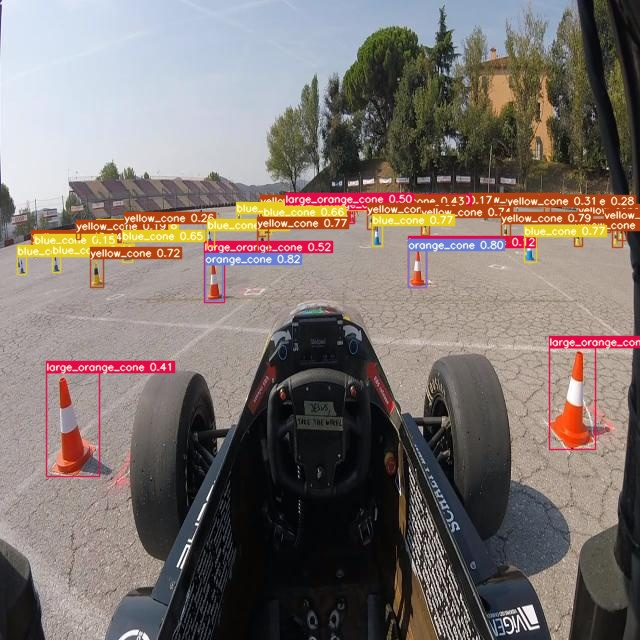

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
limit = 10000 # max images to print
for imageName in glob.glob('/content/yolov7/runs/detect/exp/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1
    

In [ ]:
# Mount google drive
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.video_visualizer import VideoVisualizer
import tqdm


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-6lnridwe
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-6lnridwe
     |████████████████████████████████| 50 kB 2.9 MB/s 
     |████████████████████████████████| 79 kB 7.5 MB/s 
     |████████████████████████████████| 151 kB 39.1 MB/s 
     |████████████████████████████████| 1.4 MB 49.1 MB/s 
     |████████████████████████████████| 548 kB 56.4 MB/s 
     |████████████████████████████████| 248 kB 64.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 843 kB 45.6 MB/s 
     |████████████████████████████████| 96 kB 5.9 MB/s 
     |████████████████████████████████| 117 kB 62.1 MB/s 
     |████████

In [ ]:
import cv2

In [ ]:
# Convert inference to video
width = 640
height = 640
frames_per_second = 20
num_frames = frames_per_second * 10

# Initialize video writer
dataset = "/content/drive/MyDrive/UTFR_DV/YOLOv7"
output_path = dataset + "/autox2_out.mp4"

video_writer = cv2.VideoWriter((output_path), fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

for imageName in sorted(glob.glob('/content/yolov7/runs/detect/exp7/*.jpg')): #assuming JPG
    print(imageName)
    # Read image
    img = cv2.imread(imageName)
    # Write to video file
    video_writer.write(img)

# Release resources
video_writer.release()
cv2.destroyAllWindows()


/content/yolov7/runs/detect/exp7/ezgif-frame-001.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-002.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-003.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-004.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-005.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-006.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-007.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-008.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-009.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-010.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-011.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-012.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-013.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-014.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-015.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-016.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-017.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-018.jpg
/content/yolov7/runs/detect/exp7/ezgif-frame-0

# Reparameterize for Inference

https://github.com/WongKinYiu/yolov7/blob/main/tools/reparameterization.ipynb

# OPTIONAL: Deployment

To deploy, you'll need to export your weights and save them to use later.

In [ ]:
# optional, zip to download weights and results locally

!zip -r export.zip runs/detect
!zip -r export.zip runs/train/exp/weights/best.pt
!zip export.zip runs/train/exp/*

  adding: runs/detect/ (stored 0%)
  adding: runs/detect/exp/ (stored 0%)
  adding: runs/detect/exp/autox6_mp4-9_jpg.rf.11ab5169a0e933daafc68a1eadfdeda7.jpg (deflated 4%)
  adding: runs/detect/exp/autox6_mp4-122_jpg.rf.075da8990bb5b2d422e092ec5340e307.jpg (deflated 3%)
  adding: runs/detect/exp/skidpad_mp4-12_jpg.rf.c8615a5b09a9dda09aa981b4ff9b7c93.jpg (deflated 4%)
  adding: runs/detect/exp/autox2_mp4-43_jpg.rf.9b888b613d5695692e216fbf667581b4.jpg (deflated 3%)
  adding: runs/detect/exp/autox6_mp4-37_jpg.rf.d40a2d9757635f2bab41af272feb71ce.jpg (deflated 3%)
  adding: runs/detect/exp/autox6_mp4-61_jpg.rf.ed6c29fd2720edc086e0abbf79a3a6d1.jpg (deflated 4%)
  adding: runs/detect/exp/autox6_mp4-97_jpg.rf.470a0c5c00ebea6ca628ffc17f39d301.jpg (deflated 4%)
  adding: runs/detect/exp/autox3_mp4-2_jpg.rf.912e4a0af428d75d5e509191ff2be1d4.jpg (deflated 4%)
  adding: runs/detect/exp/autox6_mp4-164_jpg.rf.73d04545bfbb4ec6a3e5a1aeed92a38f.jpg (deflated 4%)
  adding: runs/detect/exp/autox6_mp4-228_jp

# OPTIONAL: Active Learning Example

Once our first training run is complete, we should use our model to help identify which images are most problematic in order to investigate, annotate, and improve our dataset (and, therefore, model).

To do that, we can execute code that automatically uploads images back to our hosted dataset if the image is a specific class or below a given confidence threshold.


In [ ]:
# # setup access to your workspace
# rf = Roboflow(api_key="YOUR_API_KEY")                               # used above to load data
# inference_project =  rf.workspace().project("YOUR_PROJECT_NAME")    # used above to load data
# model = inference_project.version(1).model

# upload_project = rf.workspace().project("YOUR_PROJECT_NAME")

# print("inference reference point: ", inference_project)
# print("upload destination: ", upload_project)

In [ ]:
# # example upload: if prediction is below a given confidence threshold, upload it 

# confidence_interval = [10,70]                                   # [lower_bound_percent, upper_bound_percent]

# for prediction in predictions:                                  # predictions list to loop through
#   if(prediction['confidence'] * 100 >= confidence_interval[0] and 
#           prediction['confidence'] * 100 <= confidence_interval[1]):
        
#           # upload on success!
#           print(' >> image uploaded!')
#           upload_project.upload(image, num_retry_uploads=3)     # upload image in question

# Next steps

Congratulations, you've trained a custom YOLOv7 model! Next, start thinking about deploying and [building an MLOps pipeline](https://docs.roboflow.com) so your model gets better the more data it sees in the wild.